In [47]:
import pandas as pd

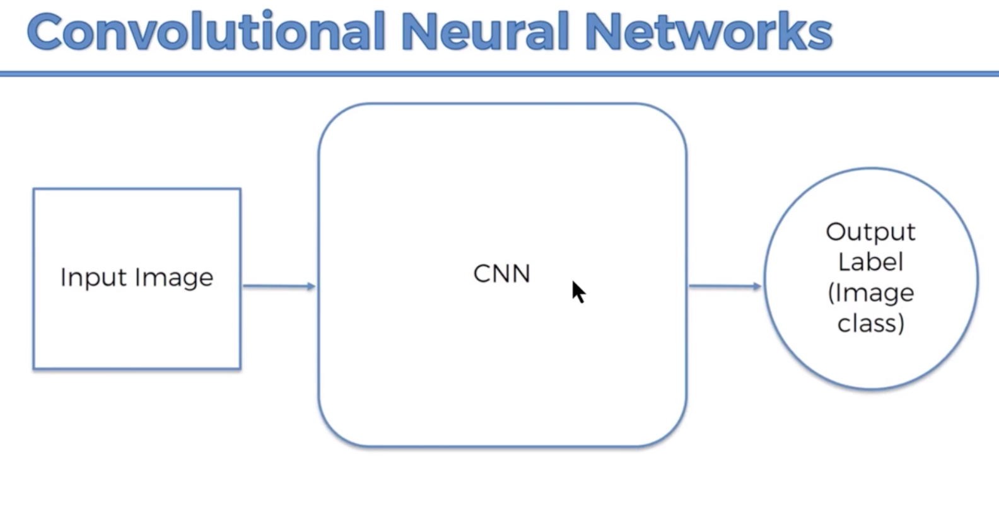

In [1]:
from IPython.display import Image
Image(filename='1.png')

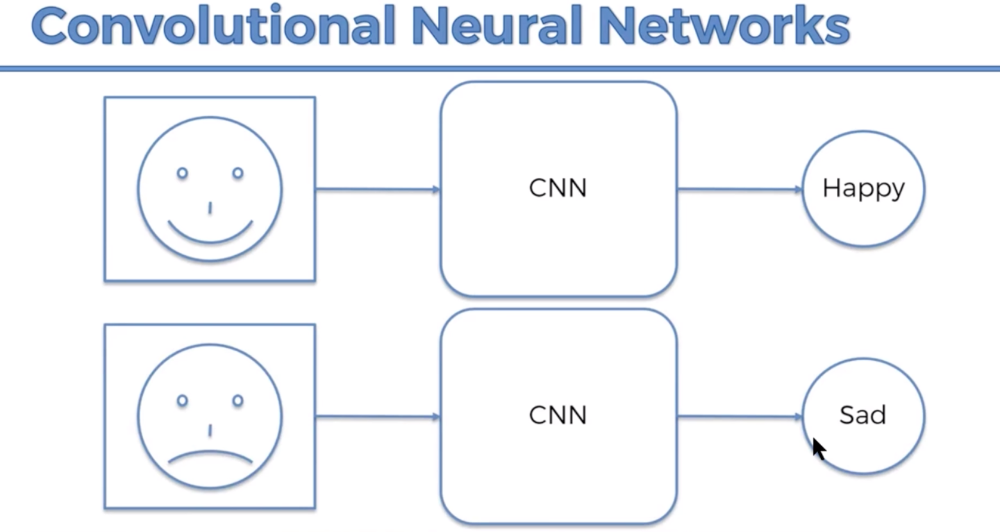

In [2]:
Image(filename='2.png')

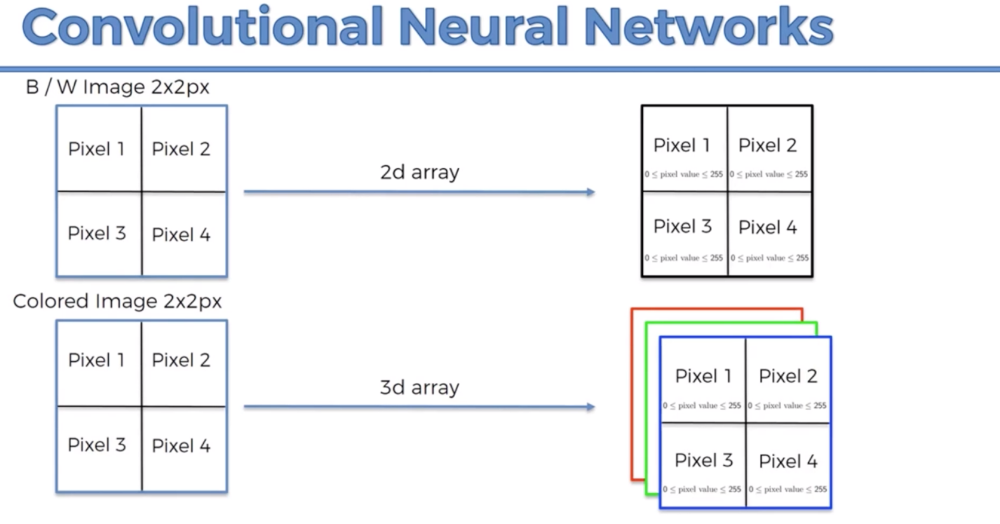

In [3]:
Image(filename='3.png')

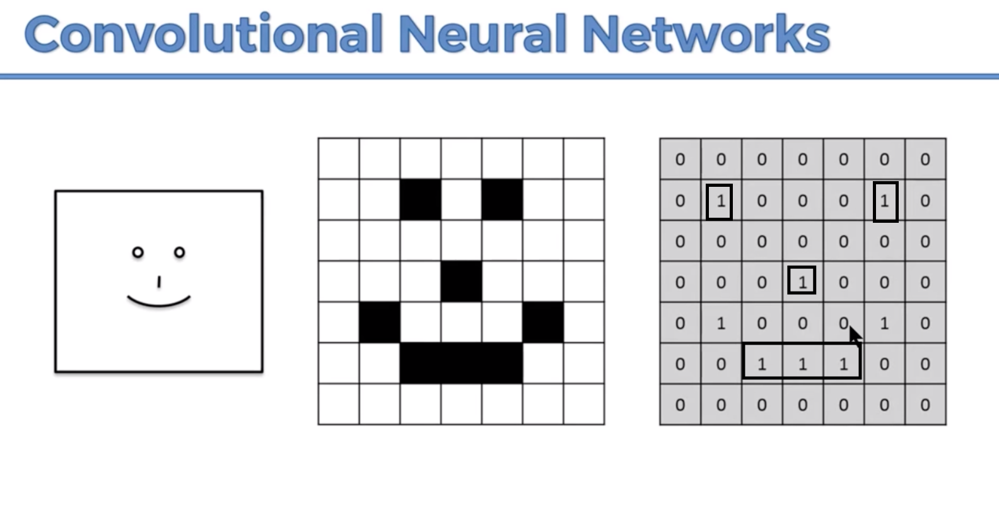

In [4]:
Image(filename='4.png')

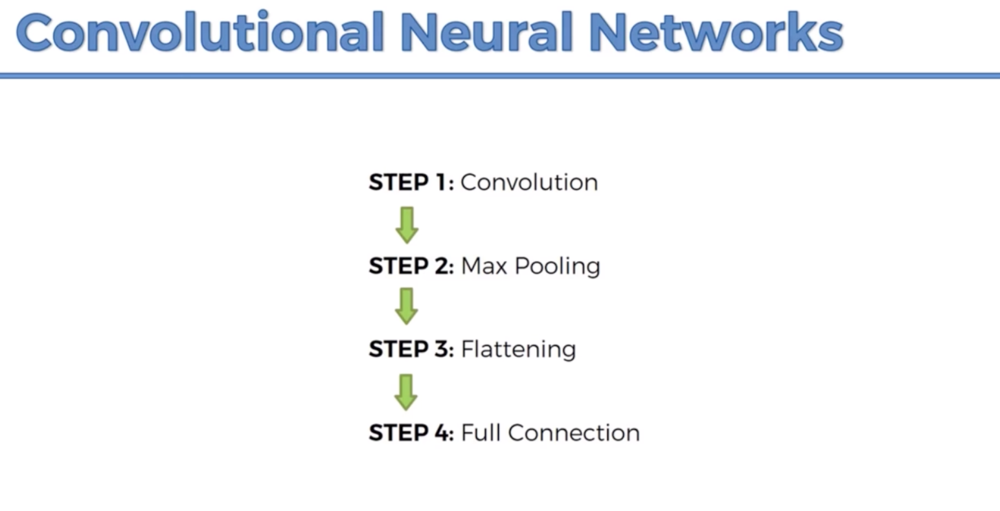

In [5]:
Image(filename='5.png')

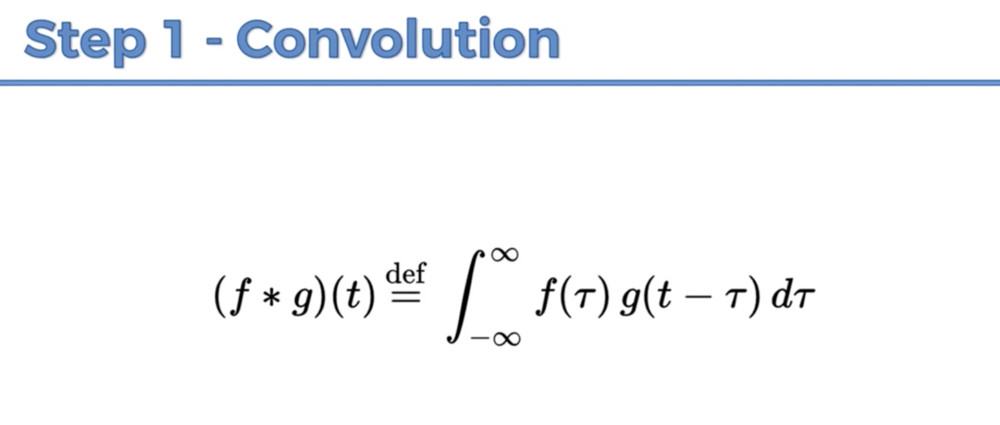

In [6]:
Image(filename='6.png')

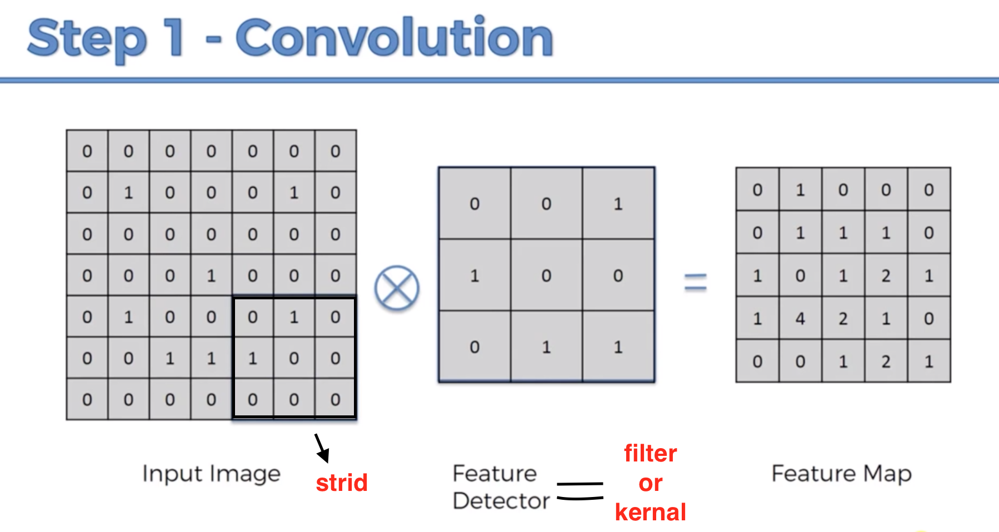

In [7]:
Image(filename='7.png')

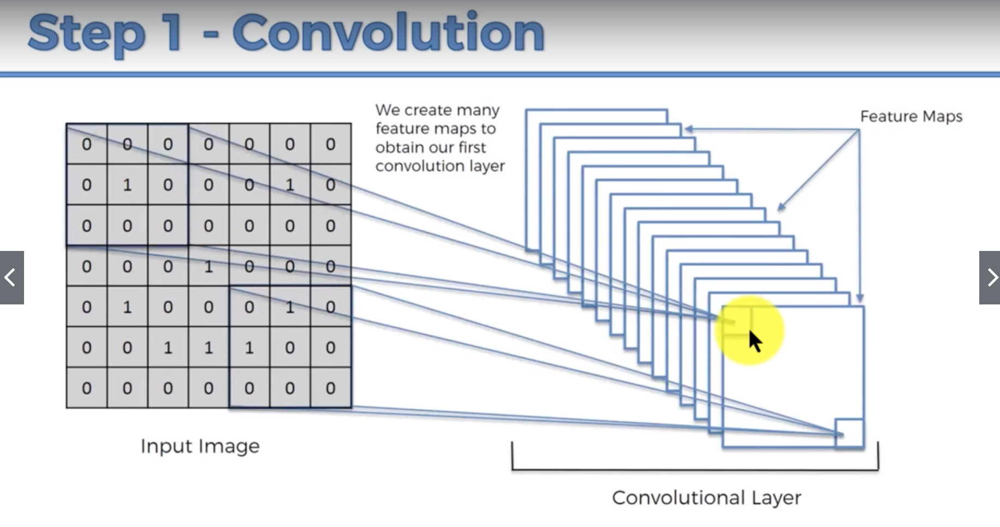

In [8]:
Image(filename='8.png')

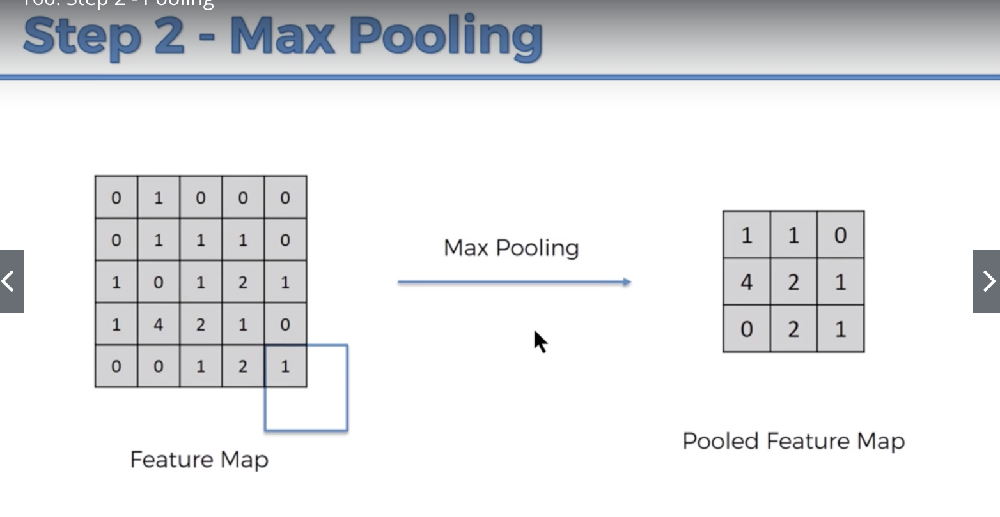

In [9]:
Image(filename='9.png')

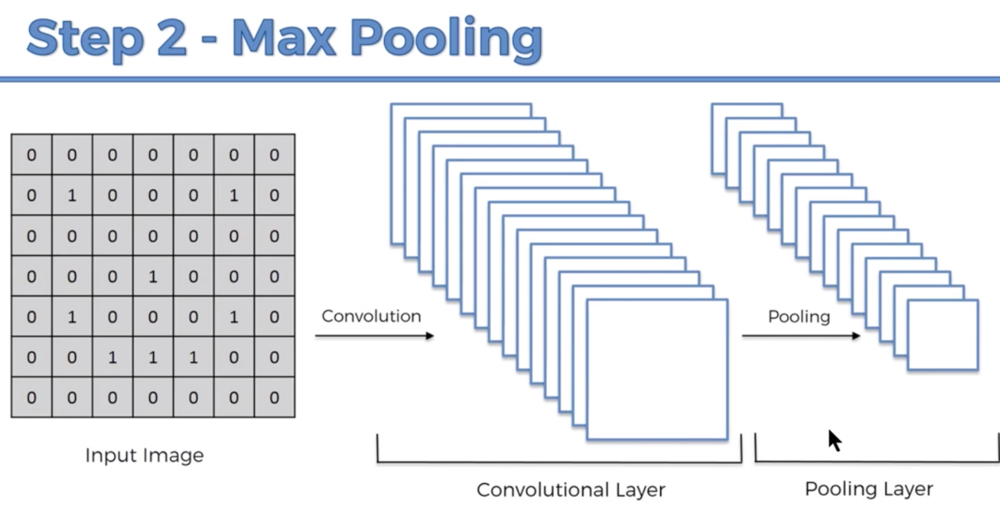

In [10]:
Image(filename='10.png')

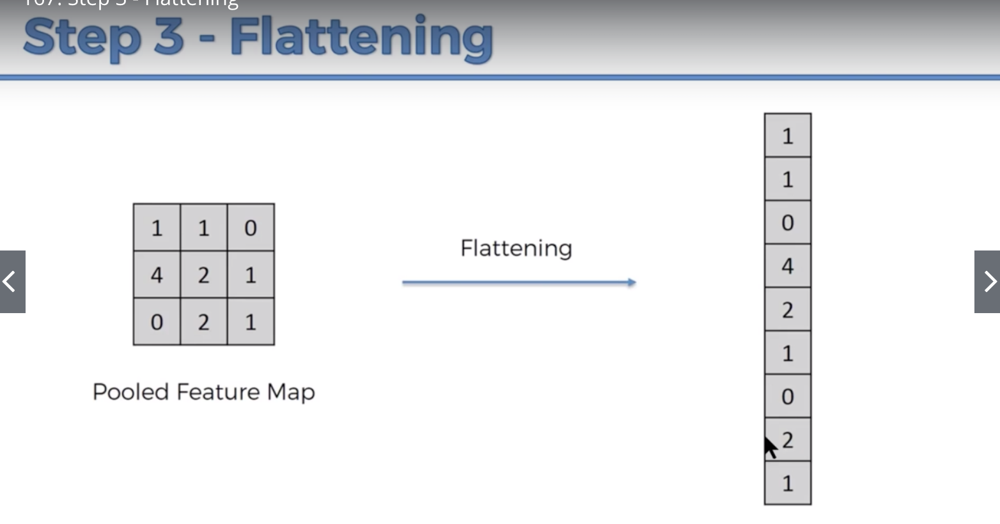

In [11]:
Image(filename='11.png')

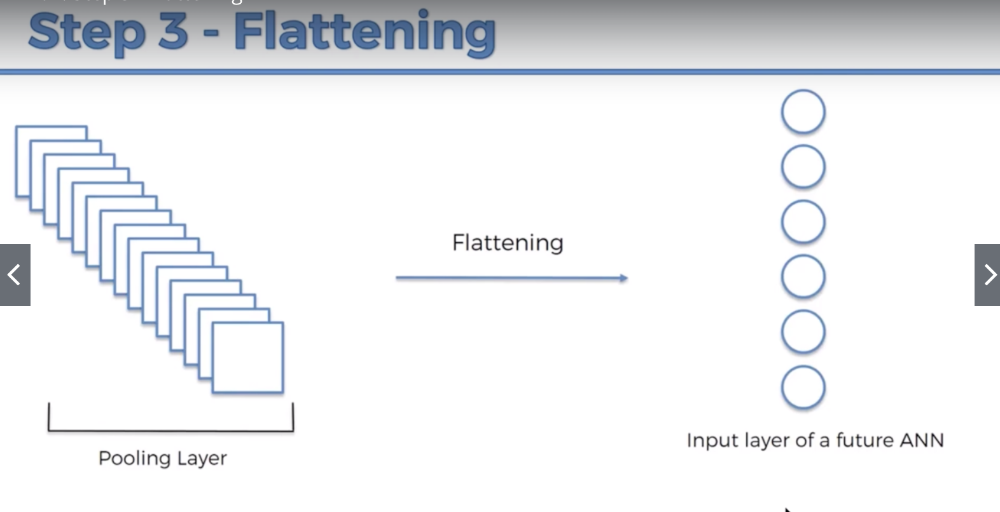

In [12]:
Image(filename='12.png')

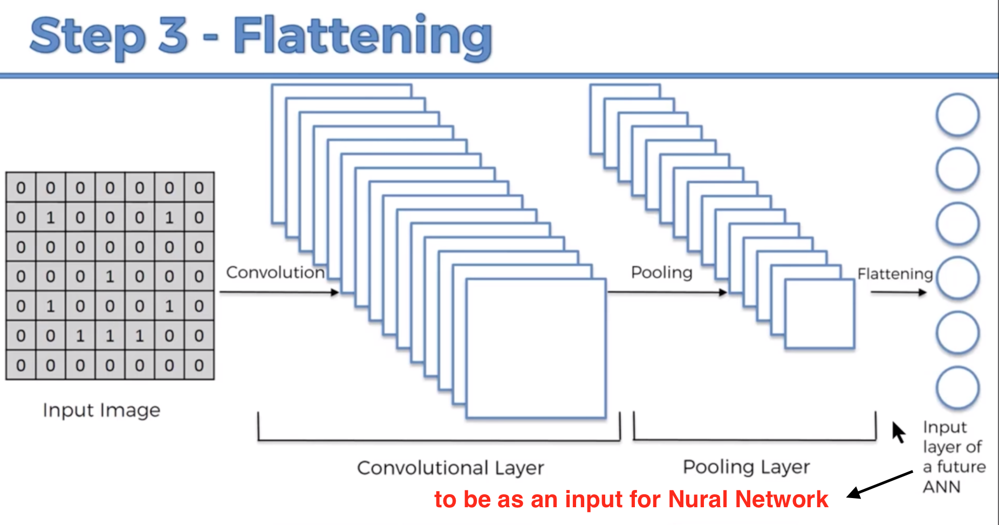

In [13]:
Image(filename='13.png')

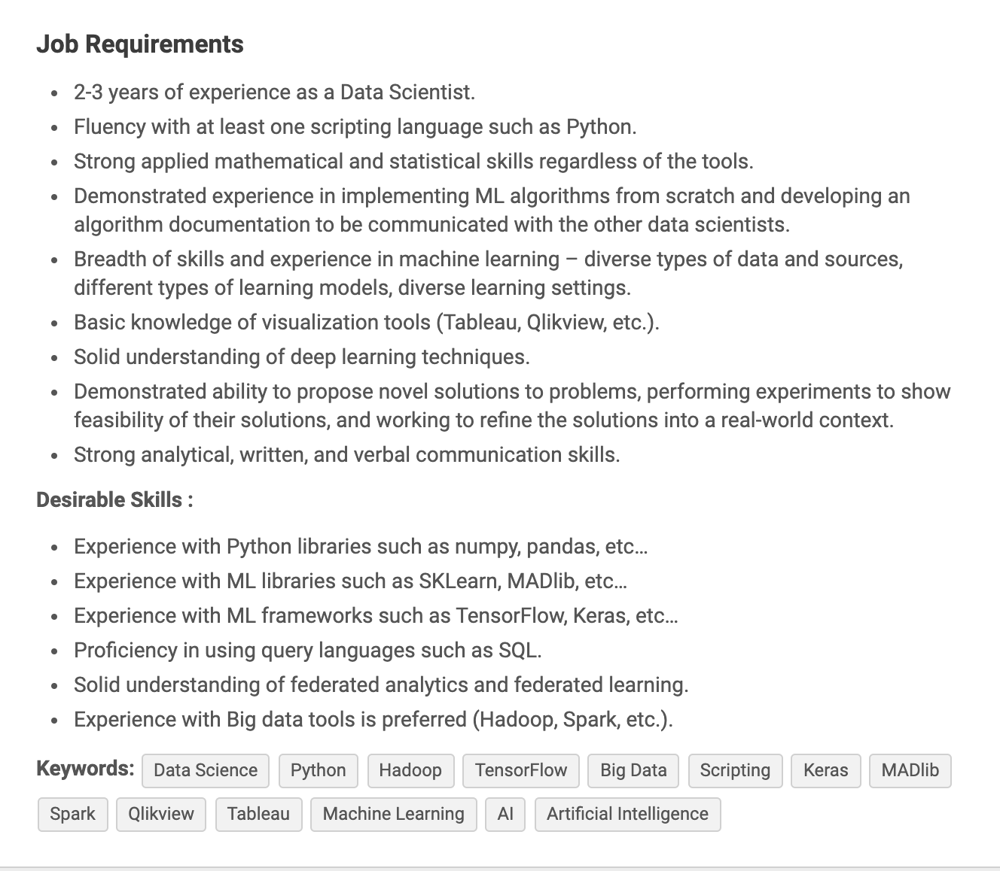

In [14]:
Image(filename='14.png')

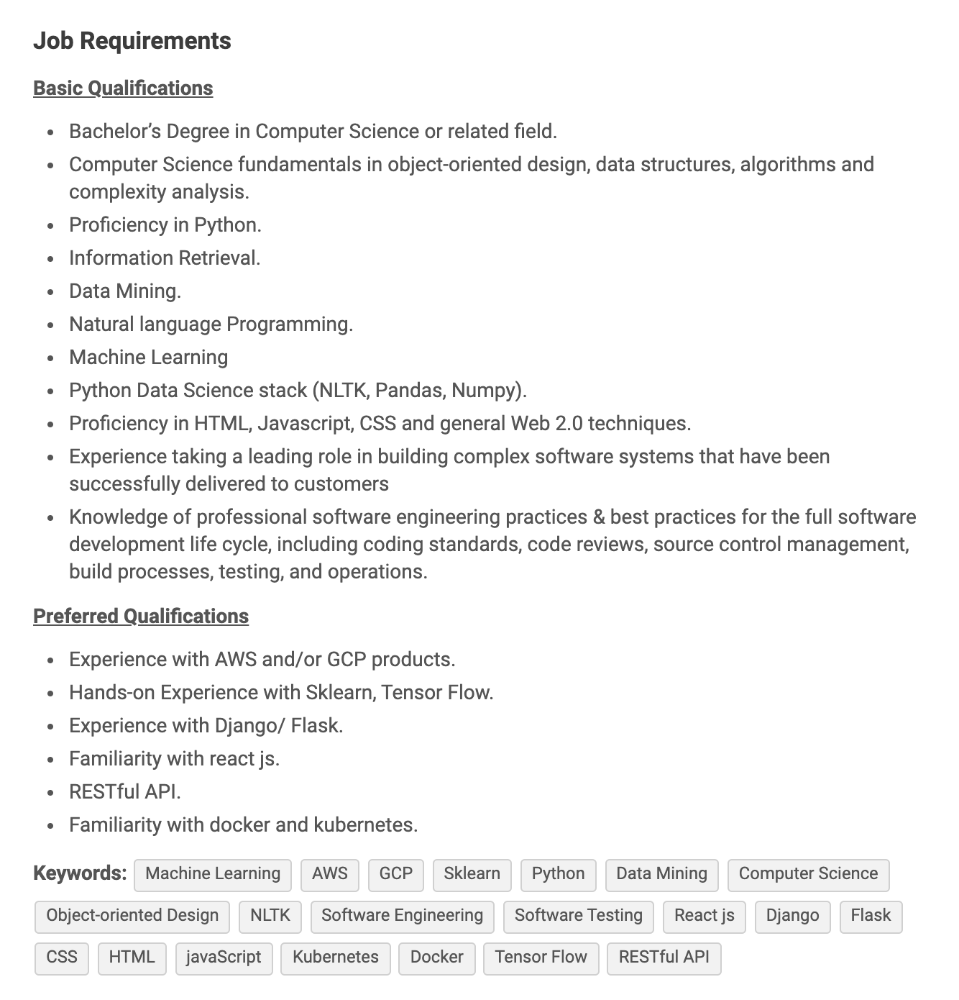

In [15]:
Image(filename='15.png')

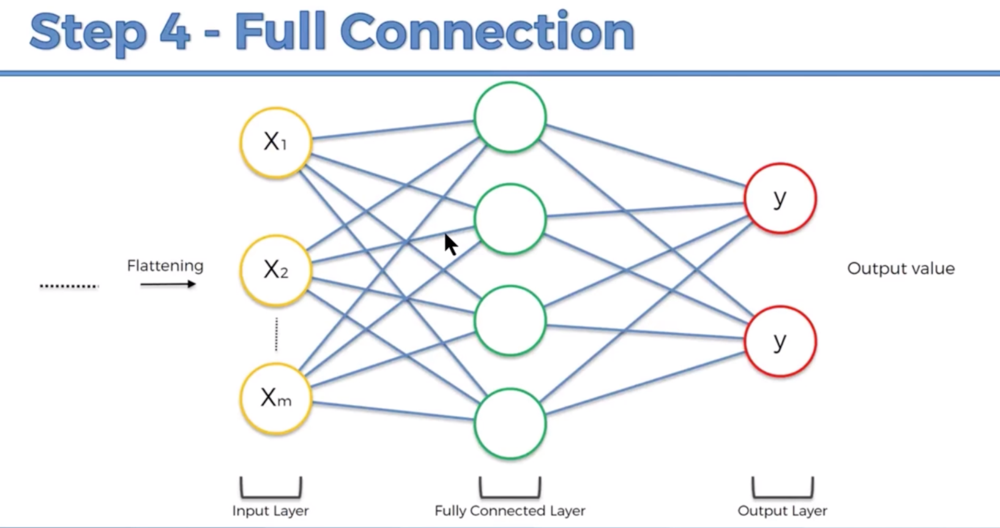

In [16]:
Image(filename='16.png')

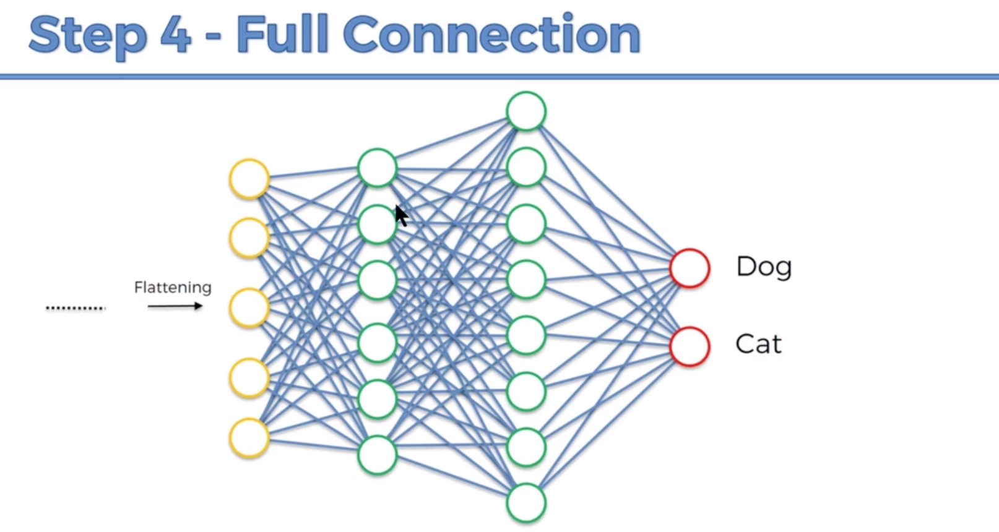

In [17]:
Image(filename='17.png')

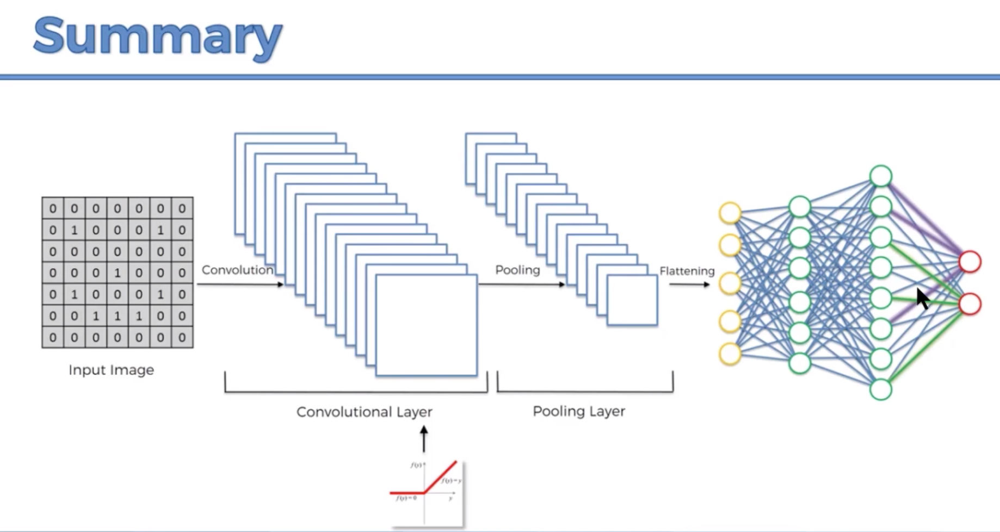

In [18]:
Image(filename='18.png')

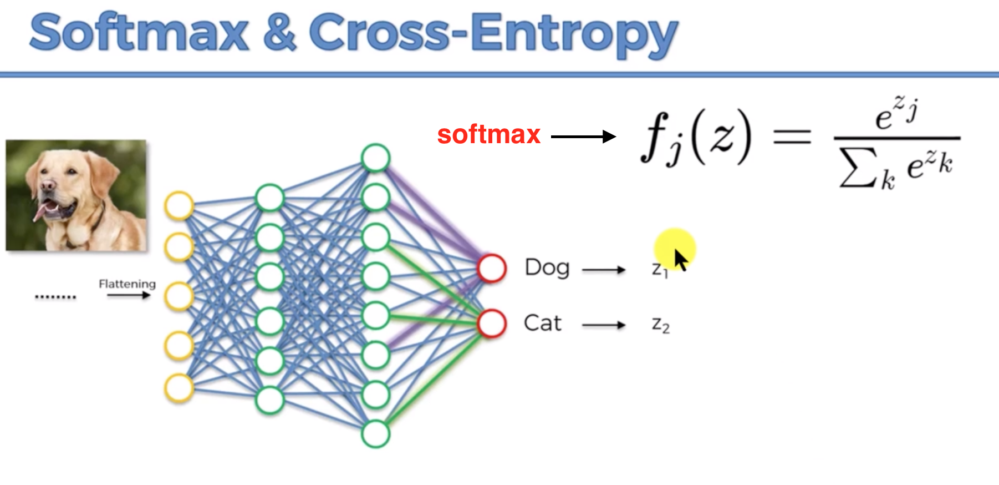

In [19]:
Image(filename='19.png')

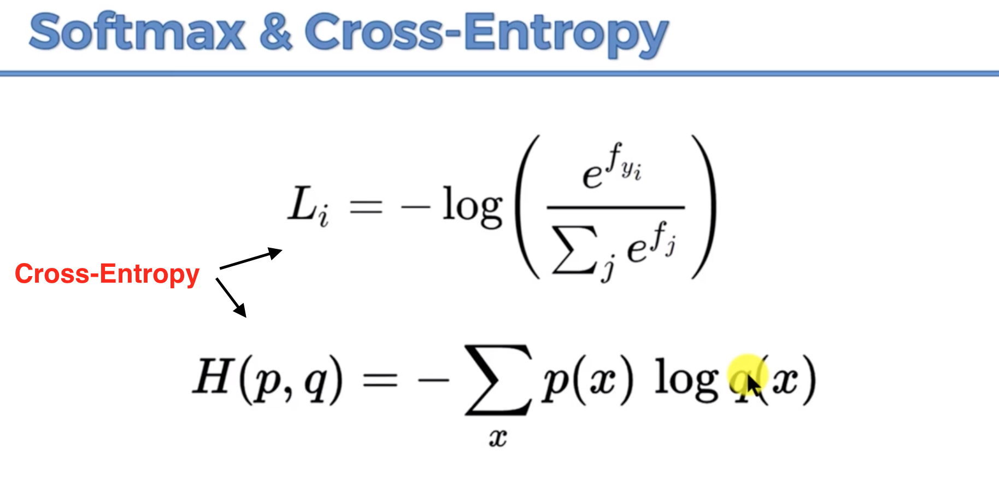

In [20]:
Image(filename='20.png')

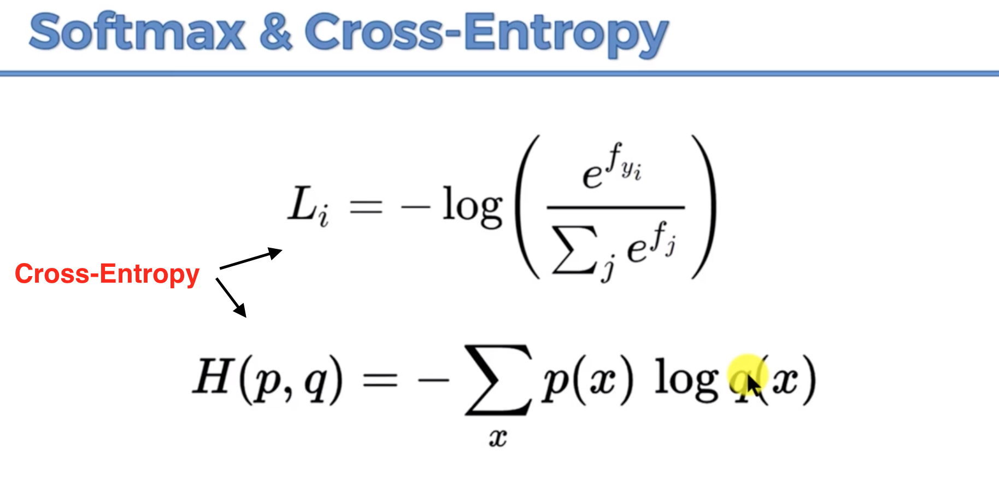

In [21]:
Image(filename='20.png')

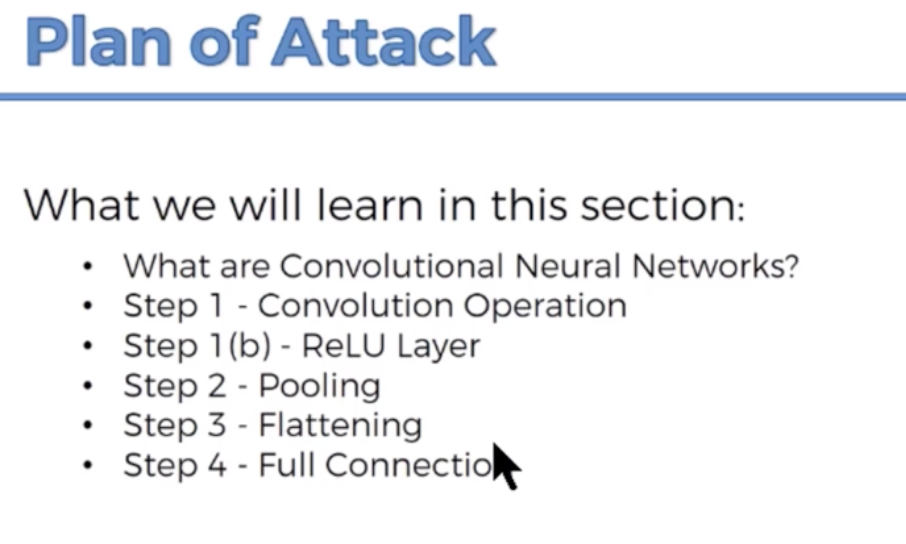

In [22]:
Image(filename='21.png')

In [23]:
# Importing the Keras libraries and packages
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Convolution2D
from tensorflow.keras.layers import MaxPool2D
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dense

In [24]:
# Initialising the CNN
model = Sequential()

## Step 1- Convolution

In [25]:
# nb_filter=32, nb_row=3, nb_col=3,
# input_shape ==> image shape RGB
model.add(Convolution2D(32, 3, 3, input_shape = (64, 64, 3), activation = 'relu'))


## Step 2 - Pooling


In [26]:
model.add(MaxPool2D(pool_size=(2,2)))


## Adding a second convolutional layer


In [27]:
model.add(Convolution2D(32, 3, 3, activation = 'relu'))
model.add(MaxPool2D(pool_size=(2,2)))


## Step 3 - Flattening


In [28]:
model.add(Flatten())


## Step 4 - Full connection


In [29]:
# units ==> output_dim
model.add(Dense(units= 128 , activation= 'relu')) # hidden layer
model.add(Dense(units= 1, activation = 'sigmoid')) # output layer


## Compiling the CNN


In [30]:
model.compile(optimizer='adam', loss= 'binary_crossentropy', metrics= ['accuracy'])


## Final step: Fitting the CNN to the images

In [31]:
'''
make a lot of images from train and test sets by cut and routate and etc
all of that for to be an a sava side of overfit
'''
from keras.preprocessing.image import ImageDataGenerator

train_data_generator = ImageDataGenerator( # a lot of data generation
        rescale=1./255,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True)

test_data_generator = ImageDataGenerator(rescale=1./255)

train_set = train_data_generator.flow_from_directory(
        'dataset/training_set',
        target_size=(64, 64), # as i made it before
        batch_size=32,
        class_mode='binary')

test_set = test_data_generator.flow_from_directory(
        'dataset/test_set',
        target_size=(64, 64),
        batch_size=32,
        class_mode='binary')

model.fit_generator(
        train_set,
        steps_per_epoch=8000, # number of image in training set
        epochs=25,
        validation_data=test_set,
        validation_steps=2000) # number of image in test set

Using TensorFlow backend.


Found 8000 images belonging to 2 classes.
Found 2000 images belonging to 2 classes.
Epoch 1/25
8000/8000 [==============================] - 1141s 143ms/step - loss: 0.5911 - accuracy: 0.6761 - val_loss: 0.5894 - val_accuracy: 0.6920
Epoch 2/25
8000/8000 [==============================] - 1135s 142ms/step - loss: 0.5273 - accuracy: 0.7344 - val_loss: 0.6136 - val_accuracy: 0.6950
Epoch 3/25
8000/8000 [==============================] - 1152s 144ms/step - loss: 0.5040 - accuracy: 0.7491 - val_loss: 0.5620 - val_accuracy: 0.7154
Epoch 4/25
8000/8000 [==============================] - 1124s 141ms/step - loss: 0.4872 - accuracy: 0.7613 - val_loss: 0.5818 - val_accuracy: 0.7096
Epoch 5/25
8000/8000 [==============================] - 1195s 149ms/step - loss: 0.4728 - accuracy: 0.7699 - val_loss: 0.5901 - val_accuracy: 0.7152
Epoch 6/25
8000/8000 [==============================] - 1200s 150ms/step - loss: 0.4619 - accuracy: 0.7769 - val_loss: 0.6047 - val_accuracy: 0.7150
Epoch 7/25
8000/8000 [

In [42]:
model.summary()


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 21, 21, 32)        896       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 10, 10, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 3, 3, 32)          9248      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 1, 1, 32)          0         
_________________________________________________________________
flatten (Flatten)            (None, 32)                0         
_________________________________________________________________
dense (Dense)                (None, 128)               4224      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 1

## Predicting the Test set results

In [45]:
predictions = model.predict(test_set)
predicted_val = [int(round(p[0])) for p in predictions]
#predicted_val = predictions > 0.5
predicted_val

[1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 0,
 0,
 1,
 1,
 0,
 1,
 1,
 0,
 1,
 1,
 1,
 0,
 1,
 0,
 1,
 1,
 0,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 0,
 1,
 0,
 1,
 1,
 0,
 1,
 0,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 0,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 1,
 1,
 0,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 1,
 1,
 0,
 0,
 1,
 1,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 0,
 1,
 0,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 1,
 0,
 0,
 1,
 1,
 1,
 0,
 0,
 0,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 1,
 0,
 1,
 0,
 0,
 1,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 1,


array([[ True],
       [ True],
       [ True],
       ...,
       [ True],
       [ True],
       [False]])

In [41]:
# from keras.preprocessing.image import ImageDataGenerator

# train_datagen = ImageDataGenerator(rescale = 1./255,
#                                    shear_range = 0.2,
#                                    zoom_range = 0.2,
#                                    horizontal_flip = True)

# test_datagen = ImageDataGenerator(rescale = 1./255)

# training_set = train_datagen.flow_from_directory('dataset/training_set',
#                                                  target_size = (64, 64),
#                                                  batch_size = 32,
#                                                  class_mode = 'binary')

# test_set = test_datagen.flow_from_directory('dataset/test_set',
#                                             target_size = (64, 64),
#                                             batch_size = 32,
#                                             class_mode = 'binary')

# model.fit_generator(training_set,
#                          steps_per_epoch = 8000,
#                          epochs = 25,
#                          validation_data = test_set,
#                          validation_steps = 2000)

### we run this model an a low congigration, so we made it a more accurate by
* 1- run it an a GPU instate of CPU
* 2- epochs = increasing it 
* 3- Data size = increasing it 
* 4- make another Convolution layer and increase number of nb_filter like 128 or more
* 5- make another fully connected layre

## anothe CNN

In [ ]:
# Importing the Keras libraries and packages
from keras.models import Sequential
from keras.layers import Convolution2D
from keras.layers import MaxPooling2D
from keras.layers import Flatten
from keras.layers import Dense

# Initialising the CNN
classifier = Sequential()

# Step 1 - Convolution
classifier.add(Convolution2D(32, 3, 3, input_shape = (64, 64, 3), activation = 'relu'))

# Step 2 - Pooling
classifier.add(MaxPooling2D(pool_size = (2, 2)))

# Adding a second convolutional layer
classifier.add(Convolution2D(32, 3, 3, activation = 'relu'))
classifier.add(MaxPooling2D(pool_size = (2, 2)))

# Step 3 - Flattening
classifier.add(Flatten())

# Step 4 - Full connection
classifier.add(Dense(output_dim = 128, activation = 'relu'))
classifier.add(Dense(output_dim = 1, activation = 'sigmoid'))

# Compiling the CNN
classifier.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['accuracy'])

# Part 2 - Fitting the CNN to the images

'''
make a lot of images from train and test sets by cut and routate and etc
all of that for to be an a sava side of overfit
'''
from keras.preprocessing.image import ImageDataGenerator

train_data_generator = ImageDataGenerator( # a lot of data generation
        rescale=1./255,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True)

test_data_generator = ImageDataGenerator(rescale=1./255)

train_set = train_data_generator.flow_from_directory(
        'dataset/training_set',
        target_size=(64, 64), # as i made it before
        batch_size=32,
        class_mode='binary')

test_set = test_data_generator.flow_from_directory(
        'dataset/test_set',
        target_size=(64, 64),
        batch_size=32,
        class_mode='binary')

model.fit_generator(
        train_set,
        steps_per_epoch=8000, # number of image in training set
        epochs=25,
        validation_data=test_set,
        validation_steps=2000) # number of image in test set